<a href="https://colab.research.google.com/github/aralbright/2021_AAMSME/blob/main/notebooks/novosparc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Novosparc

Input: adata_corrected.h5ad

Result: virtual in situ hybridizations

In [1]:
!pip install anndata
!pip install color_tol
!pip install scanpy
!pip install novosparc

!pip install matplotlib==3.1.3

     |████████████████████████████████| 13.1 MB 18.3 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.5.1
    Uninstalling matplotlib-3.5.1:
      Successfully uninstalled matplotlib-3.5.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scanpy 1.9.1 requires matplotlib>=3.4, but you have matplotlib 3.1.3 which is incompatible.
novosparc 0.4.3 requires matplotlib>=3.3.2, but you have matplotlib 3.1.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [2]:
# Setup

import novosparc

import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import altair as alt
from color_tol import qualitative
from scipy.spatial.distance import cdist, squareform, pdist
from scipy.stats import ks_2samp
from scipy.stats import pearsonr

%config InlineBackend.figure_format = 'retina'

import random
random.seed(0)

In [3]:
my_map = qualitative(10)

In [4]:
my_colors = ListedColormap(my_map.html_colors[:8])

In [5]:
!wget https://datadryad.org/stash/downloads/file_stream/1451480 -O adata_corrected.h5ad

--2022-04-27 23:25:09--  https://datadryad.org/stash/downloads/file_stream/1451480
Resolving datadryad.org (datadryad.org)... 34.212.247.214, 100.20.51.141
Connecting to datadryad.org (datadryad.org)|34.212.247.214|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://dryad-assetstore-merritt-west.s3.us-west-2.amazonaws.com/ark%3A/13030/m5z66zg8%7C4%7Cproducer/adata_corrected.h5ad?response-content-type=application%2Fx-hdf&X-Amz-Security-Token=IQoJb3JpZ2luX2VjEA8aCXVzLXdlc3QtMiJIMEYCIQCkePPBPAuOLJutVMHnaVObOHSZxXkMVYujtHXkz9o83QIhAPl3glcgWQWVvhlXaWaI26ijwa4krlYKkyUo2AXY07zEKtsECMf%2F%2F%2F%2F%2F%2F%2F%2F%2F%2FwEQABoMNDUxODI2OTE0MTU3IgyHbkXR6jM%2Btwb6EAkqrwQpgYoJ8XyFOHzrI2VcKIMkcIwSk3OvWlH%2F3k0tVmNKm33yrE49DY2x8l4meaXyy47CicukkavFOnXIM4Z3b5F5ZtatjA7WA8BBLS7ygxD7c5B6pBrzNSnNVLWro9ISNfnxZKNKhSiWspi%2BMihDsHrnid5h4kjBDbIAH3YrXOM87NFP2%2BvFwb4EV5rAXX76HgRsdsYbmPPkDp0In6FRVTyqXbnTek%2BwwZIRJVxWTJJp5pKdj3dlrb5usLCmJtao2Umiju74zwL70ma%2F3gQUfLnv7dwKdcoDCiOiGQSb

In [6]:
# Load adata
adata = anndata.read_h5ad("adata_corrected.h5ad")

In [7]:
adata.X = adata.layers['scvi_norm_log']

In [8]:
# remove unwanted clusters 
adata = adata[adata.obs.leiden_scVI != ("8" and "9")]

In [9]:
# this function is from a novosparc pull request not implemented yet 
# https://github.com/rajewsky-lab/novosparc/pull/49#issuecomment-873868118

def quantify_clusters_spatially(tissue):
    """Maps the annotated clusters obtained from the scRNA-seq analysis onto
    the tissue space.
    Args:
        tissue: the novosparc tissue object containing the gene expression data,
                the clusters annotation and the spatial reconstruction. Assumes
                that the cluster annotation exists in the underlying anndata object.
    Returns:
        [numpy array]: An array of the cluster annotation per tissue position.
    """
    clusters = tissue.dataset.obs['leiden_scVI'].to_numpy().flatten()
    return np.array([np.argmax(np.array([np.median(np.array(tissue.gw[:, location][np.argwhere(clusters == cluster).flatten()]))
                                         for cluster in np.unique(clusters)])) for location in range(len(tissue.locations))])


In [10]:
# download geometry file 
!wget https://raw.githubusercontent.com/rajewsky-lab/novosparc/master/novosparc/datasets/bdtnp/geometry.txt -O geometry.txt

--2022-04-27 23:26:17--  https://raw.githubusercontent.com/rajewsky-lab/novosparc/master/novosparc/datasets/bdtnp/geometry.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 116867 (114K) [text/plain]
Saving to: ‘geometry.txt’

geometry.txt        100%[===================>] 114.13K  --.-KB/s    in 0.009s  

2022-04-27 23:26:17 (12.6 MB/s) - ‘geometry.txt’ saved [116867/116867]



In [11]:
locations = pd.read_csv('geometry.txt', sep=' ')
num_locations = 3039
locations_apriori = locations[:num_locations][['xcoord', 'zcoord']].values

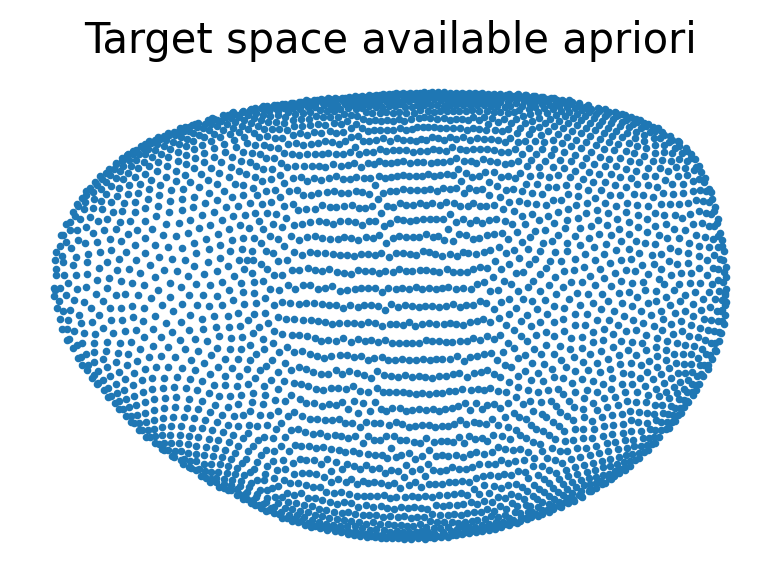

In [12]:
tit_size = 15
dpi = 100
fig, ax = plt.subplots(figsize=(4,3), dpi=dpi)

ax.scatter(locations_apriori[:, 0], locations_apriori[:, 1], s=3)

ax.set_title('Target space available apriori', size=tit_size)

ax.axis('off')

plt.tight_layout()
plt.show()

In [13]:
# download reference expression matrix 
!wget https://raw.githubusercontent.com/rajewsky-lab/novosparc/master/novosparc/datasets/bdtnp/dge.txt -O dge.txt

--2022-04-27 23:26:17--  https://raw.githubusercontent.com/rajewsky-lab/novosparc/master/novosparc/datasets/bdtnp/dge.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2269132 (2.2M) [text/plain]
Saving to: ‘dge.txt’

dge.txt             100%[===================>]   2.16M  --.-KB/s    in 0.03s   

2022-04-27 23:26:18 (84.6 MB/s) - ‘dge.txt’ saved [2269132/2269132]



In [14]:
atlas = sc.read('dge.txt')
atlas_genes = atlas.var.index.tolist()
locations = locations_apriori
atlas.obsm['spatial'] = locations

In [15]:
pl_genes = ['Antp', 'Dfd', 'ftz']

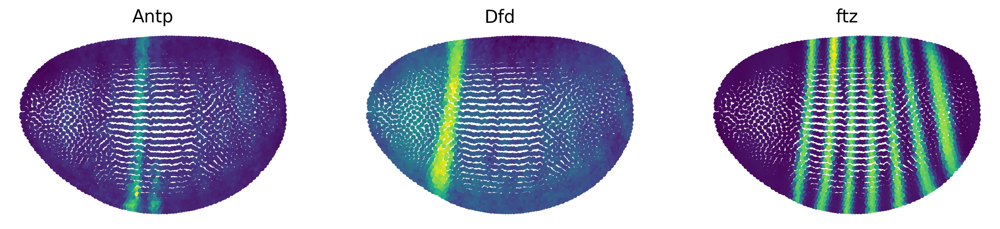

<Figure size 432x288 with 0 Axes>

In [16]:

novosparc.pl.embedding(atlas, pl_genes)

## all nuclei

In [17]:
adata

View of AnnData object with n_obs × n_vars = 7981 × 6000
    obs: 'cell_counts', 'n_genes', 'percent_mito', 'n_counts', 'batch', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scVI'
    var: 'gene', 'gene_id', 'gene_counts-0', 'n_cells-0', 'gene_counts-1', 'n_cells-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'dendrogram_leiden_scVI', 'hvg', 'leiden', 'leiden_scVI_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_scvi', 'X_umap'
    varm: 'PCs'
    layers: 'X_scvi_norm', 'X_scvi_raw', 'log1p', 'norm', 'norm_log_unscaled', 'raw', 'scvi_norm_log'
    obsp: 'connectivities', 'distances'

In [18]:
dataset = adata

In [19]:
gene_names = dataset.var.index.tolist()

num_cells, num_genes = dataset.shape # 1297 cells x 8924 genes

print('number of cells: %d' % num_cells)
print('number of genes: %d' % num_genes)


number of cells: 7981
number of genes: 6000


In [20]:
tissue = novosparc.cm.Tissue(dataset=dataset, locations=locations)

In [21]:
# params for smooth cost
num_neighbors_s = num_neighbors_t = 5

# params for linear cost
markers = list(set(atlas_genes).intersection(adata.var.gene))
atlas_matrix = atlas.to_df()[markers].values
markers_idx = pd.DataFrame({'markers_idx': np.arange(num_genes)}, index=gene_names)
markers_to_use = np.concatenate(markers_idx.loc[markers].values)


In [22]:
# this takes ~20 minutes 
# alternative 1: setup both assumptions 
tissue.setup_reconstruction(atlas_matrix=atlas_matrix, 
                            markers_to_use=markers_to_use, 
                            num_neighbors_s=num_neighbors_s, 
                            num_neighbors_t=num_neighbors_t)

# alternative 2: handling each assumption separately
#tissue.setup_smooth_costs(dge_rep=dge_rep)
#tissue.setup_linear_cost(markers_to_use, atlas_matrix)

Setting up for reconstruction ... done ( 46.23 seconds )


In [23]:
# this takes ~5 minutes
# compute optimal transport of cells to locations
alpha_linear = 0.8
epsilon = 5e-3
tissue.reconstruct(alpha_linear=alpha_linear, epsilon=epsilon)

Reconstructing spatial information with 65 markers: 7981 cells and 3039 locations ... 
Trying with epsilon: 5.00e-03


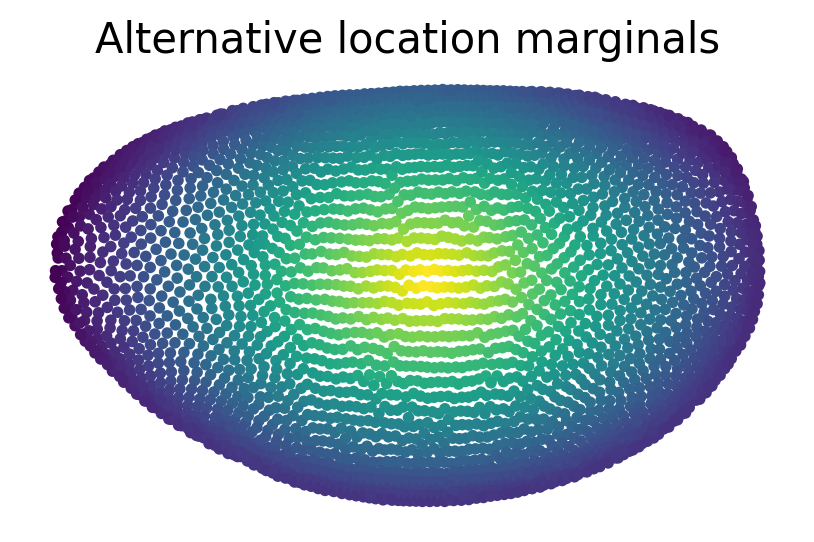

<Figure size 432x288 with 0 Axes>

In [24]:
# configure locations probability values
rdist = novosparc.gm.prob_dist_from_center(locations)
atlas.obs['Alternative location marginals'] = rdist

novosparc.pl.embedding(atlas, ['Alternative location marginals'])
#tissue.reconstruct(alpha_linear=alpha_linear, epsilon=epsilon, p_locations=rdist)

In [25]:
leiden_location = quantify_clusters_spatially(tissue)

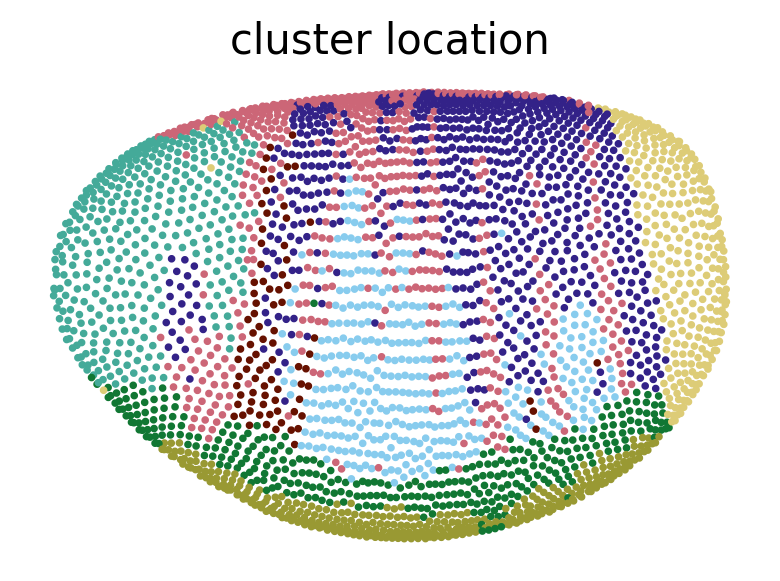

In [26]:
tit_size = 15
dpi = 100
fig, ax = plt.subplots(figsize=(4,3), dpi=dpi)

ax.scatter(locations_apriori[:, 0], locations_apriori[:, 1], c=leiden_location, cmap = my_colors, s=3)

ax.set_title('cluster location', size=tit_size)


ax.axis('off')



plt.tight_layout()
plt.show()

Cluster 0

In [27]:
pl_genes = ['CG5888', 'mnd', 'geko']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


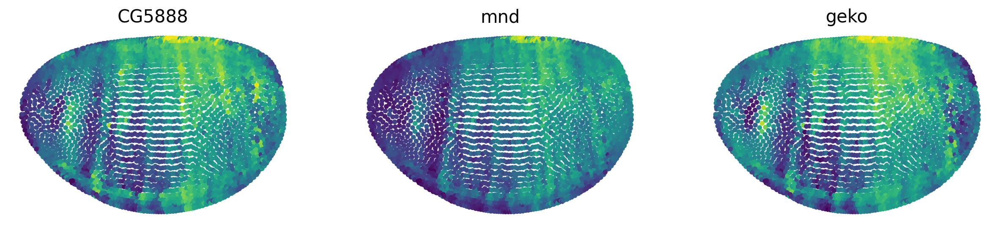

<Figure size 432x288 with 0 Axes>

In [28]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 1

In [29]:
pl_genes = ['Trim9', 'Meltrin', 'Antp']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


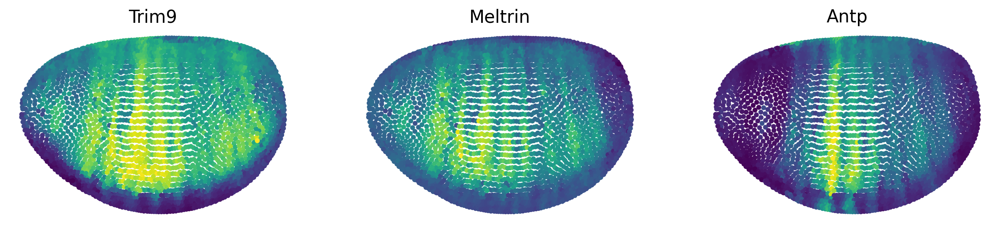

<Figure size 432x288 with 0 Axes>

In [30]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 2

In [31]:
pl_genes = ['CG42342', 'Adgf-A', 'otk']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


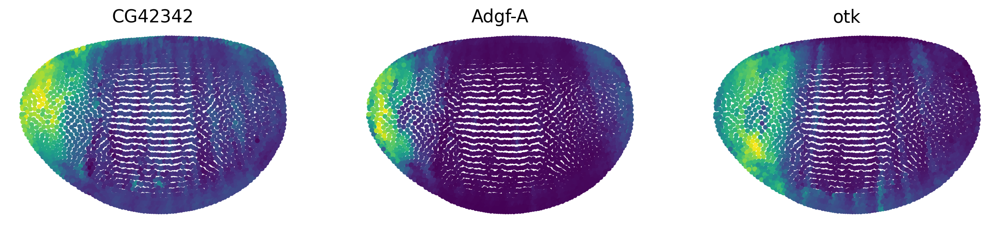

<Figure size 432x288 with 0 Axes>

In [32]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 3

In [33]:
pl_genes = ['Ilp4', 'NetA', 'neur']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


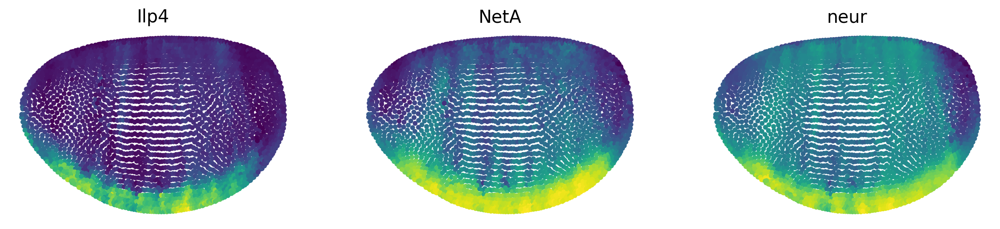

<Figure size 432x288 with 0 Axes>

In [34]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 4

In [35]:
pl_genes = ['htl', 'CG9005', 'stumps']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


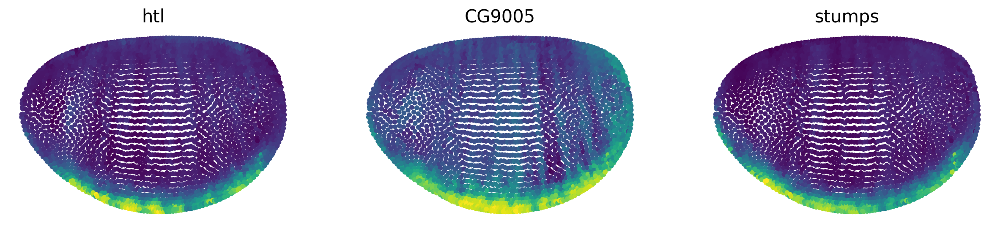

<Figure size 432x288 with 0 Axes>

In [36]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 5

In [37]:
pl_genes = ['fkh', 'disco', 'byn']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


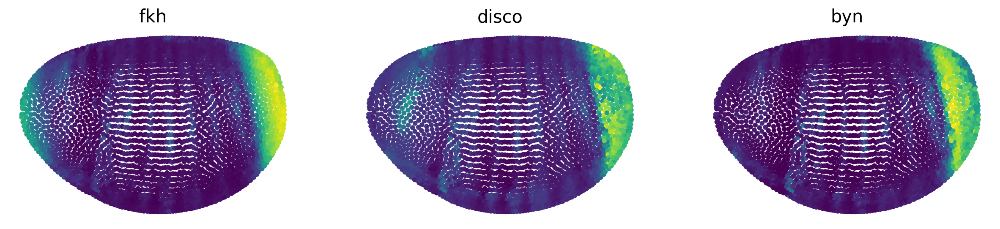

<Figure size 432x288 with 0 Axes>

In [38]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 6

In [39]:
pl_genes = ['hth', 'Meltrin', 'jbug']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


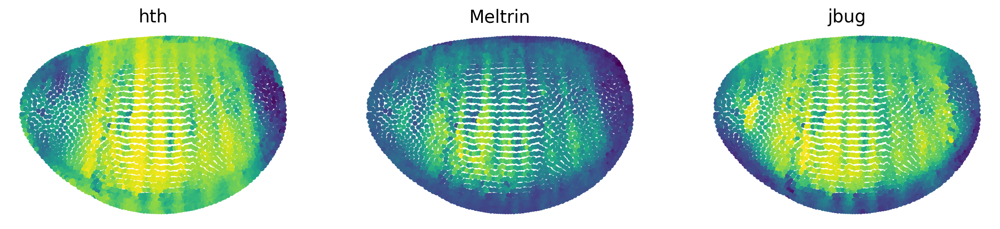

<Figure size 432x288 with 0 Axes>

In [40]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

Cluster 7

In [41]:
pl_genes = ['net', 'mtd', 'mew']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


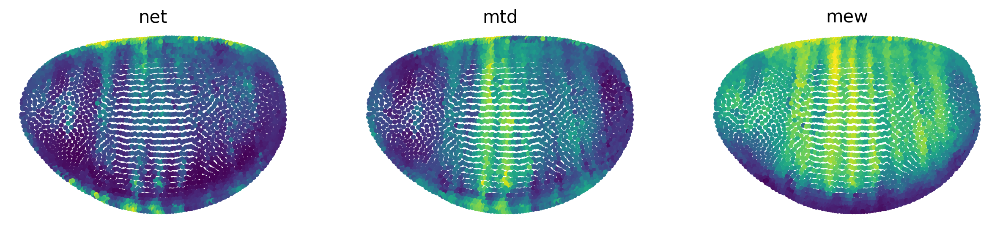

<Figure size 432x288 with 0 Axes>

In [42]:
# reconstructed expression of individual genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations

#title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes) #title=title)

## Extra

In [43]:
dataset_reconst.obs.index = dataset_reconst.obs.index.map(str)

Finding gene archetypes ... done


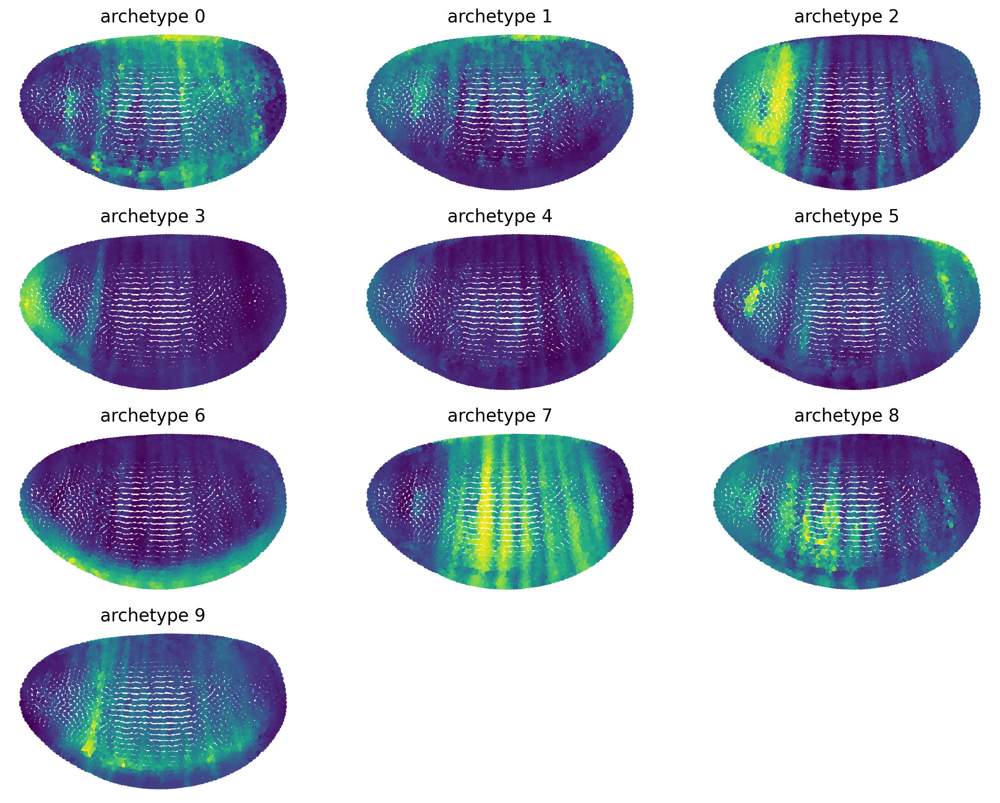

<Figure size 432x288 with 0 Axes>

In [59]:
# plot spatial expression archetypes
num_clusters = 10
atlas_indices = pd.DataFrame(np.arange(num_genes), index=gene_names)[0].loc[markers].values
archetypes, clusters, gene_corrs = novosparc.rc.find_spatial_archetypes(num_clusters, sdge[atlas_indices,:])

arch_cols = ['archetype %d'% i for i in np.arange(num_clusters)]
#dataset_reconst.obs = pd.DataFrame(index=dataset_reconst.obs.index)
df = pd.DataFrame(archetypes.T, columns=arch_cols)
dataset_reconst.obs = pd.merge(pd.DataFrame(dataset_reconst.obs), df, on = dataset_reconst.obs.index)
#dataset_reconst.obs = pd.concat((dataset_reconst.obs, df), 1)

novosparc.pl.embedding(dataset_reconst, arch_cols)

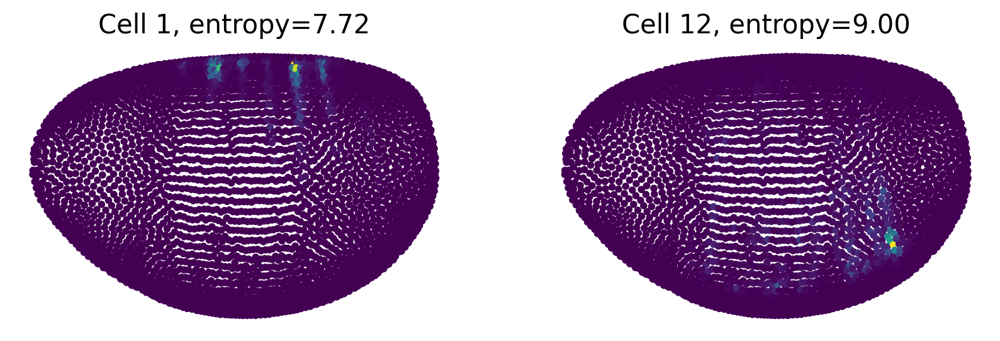

<Figure size 432x288 with 0 Axes>

In [60]:

# probability of individual cells belonging to each location
gw = tissue.gw
ngw = (gw.T / gw.sum(1)).T
cell_idx = [1, 12]
cell_prb_cols = ['cell %d' % i for i in cell_idx]
dataset_reconst.obs = pd.DataFrame(ngw.T[:, cell_idx], columns=cell_prb_cols)

title=['Cell %d, entropy=%.02f' % (i, novosparc.an.get_cell_entropy(ngw[i,:])) for i in cell_idx]
novosparc.pl.embedding(dataset_reconst, cell_prb_cols, title=title)

In [61]:

# comparing distributions of entropy for transporting a cell to locations
ent_T, ent_T_unif, ent_T_rproj, ent_T_shuf = novosparc.pl.plot_transport_entropy_dist(tissue)

print(ks_2samp(ent_T, ent_T_rproj))
print(ks_2samp(ent_T, ent_T_shuf))

Reconstructing spatial information with 65 markers: 7981 cells and 3039 locations ... 
Trying with epsilon: 5.00e-03


KeyboardInterrupt: ignored

In [ ]:
!wget https://raw.githubusercontent.com/aralbright/2021_AAMSME/main/bin/singlegeneDE.csv -O singlegeneDE.csv

In [ ]:
singlegeneDE = pd.read_csv('singlegeneDE.csv')

In [ ]:
singlegeneDE['0']

In [ ]:
# Looking for spatially informative genes according to reconstruction in highly variable genes

cyc_genes = list(singlegeneDE['0'])
#[g for g in gene_names if g.startswith('Cyc')]
atlas_genes = list(set(atlas_genes).intersection(adata.var.gene))
mI_genes = cyc_genes + atlas_genes

tissue.calculate_spatially_informative_genes(mI_genes)
genes_with_scores = tissue.spatially_informative_genes

genes_with_scores.index = genes_with_scores['genes']

gene_groups = {'Atlas': atlas_genes, 'Cell-cycle': cyc_genes}
novosparc.pl.plot_morans_dists(genes_with_scores, gene_groups)

gene_max_mI = genes_with_scores['genes'].iloc[0]
gene_min_mI = genes_with_scores['genes'].iloc[-1]

title = ['%s, Morans`I=%.02f' % (gene_max_mI, genes_with_scores.loc[gene_max_mI]['mI']), 
         '%s, Morans`I=%.02f' % (gene_min_mI, genes_with_scores.loc[gene_min_mI]['mI'])]

novosparc.pl.embedding(dataset_reconst, [gene_max_mI, gene_min_mI], title=title)

print('Mean Morans I for cell-cycle genes: %.02f' % genes_with_scores.loc[cyc_genes]['mI'].mean())
print('Mean Morans I for atlas genes: %.02f' % genes_with_scores.loc[atlas_genes]['mI'].mean())

In [ ]:
genes_with_scores.head(50)